In [1]:
import numpy as np
import matplotlib.pyplot as plt
import copy

import torch
import torch.nn as nn
from torch.autograd import Variable
import torch.nn.functional as F
import torch.optim as optim

from torchvision import datasets, models, transforms
from typing import List, Tuple

from easydict import EasyDict as edict
import pickle

# In[21]:


args = edict({})
args.image_size = 240
args.batch_size = 40
args.log_interval = 100
args.std_sched = .3


# In[6]:


# normalization used to train VGG
# see https://pytorch.org/hub/pytorch_vision_vgg/
v_mean = np.array([0.485, 0.456, 0.406])
v_std = np.array([0.229, 0.224, 0.225])
transforms_norm = transforms.Normalize(mean=v_mean, std=v_std) # to normalize colors on the imagenet dataset


# In[7]:


transform_base =  transforms.Compose([
            transforms.Resize((int(args.image_size), int(args.image_size))),
            transforms.ToTensor(),  # Convert the image to pyTorch Tensor data type.
            transforms_norm, ])      
    


# In[8]:

#image_path = "/envau/work/brainets/dauce.e/data/Imagenet/"
#image_path = "/home/INT/dauce.e/data/Imagenet_full/"
image_path = "/media/manu/Seagate Expansion Drive/Data/Imagenet/"
#image_path = "/run/user/1001/gvfs/sftp:host=bag-008-de03/envau/work/brainets/dauce.e/data/Imagenet/"
#image_path = "../data/animal/"
#image_path = "../animal/"


image_dataset = { 'train' : datasets.ImageFolder(
                            image_path+'train',
                            transform=transform_base
                        ),
                  'test' : datasets.ImageFolder(
                            image_path+'val',
                          transform=transform_base
                        )
                }


# In[9]:


num_workers = 1

dataloader_orig = { 'train' : torch.utils.data.DataLoader(
                            image_dataset['train'], batch_size=args.batch_size,
                            shuffle=True, 
                            num_workers=num_workers,
                        ),
               'test' : torch.utils.data.DataLoader(
                   image_dataset['test'], batch_size=args.batch_size,
                            shuffle=True, 
                            num_workers=num_workers,
                        )
             }






# Créez un DataLoader pour le sous-ensemble en utilisant SubsetRandomSampler
from torch.utils.data import SubsetRandomSampler
n_labels = 1000
if n_labels < 1000:
    # Créez un sous-ensemble en sélectionnant les indices des échantillons que vous souhaitez inclure
    train_size = 1300 * n_labels
    test_size = 50 * n_labels
    labels = np.random.permutation(1000)[:n_labels]
    train_indices = []
    test_indices = []
    for i in labels:
        train_indices += list(1300 * i + np.arange(1300))
        test_indices += list(50 * i + np.arange(50)) 

    subset_indices = {'train': train_indices, 'test': test_indices}
    print(labels, test_indices)

    dataloader = {}
    for cat in ('train', 'test'):
        dataloader[cat] = torch.utils.data.DataLoader(
            dataset=dataloader_orig[cat].dataset,  # Utilisez le même ensemble de données que le DataLoader d'origine
            batch_size=dataloader_orig[cat].batch_size,
            sampler=SubsetRandomSampler(subset_indices[cat]),  # Utilisez SubsetRandomSampler avec les indices du sous-ensemble
            num_workers=dataloader_orig[cat].num_workers,
            pin_memory=dataloader_orig[cat].pin_memory,
            )
else:
    labels = range(1000)
    train_indices = []
    test_indices = []
    for i in labels:
        train_indices += list(100 * i + np.arange(100))
        test_indices += list(10 * i + np.arange(10)) 

    subset_indices = {'train': train_indices, 'test': test_indices}
    dataloader = dataloader_orig


def expand_dim(tensor, dim, desired_dim_len):
    sz = list(tensor.size())
    sz[dim]=desired_dim_len
    return tensor.expand(tuple(sz))


# In[14]:


def negentropy_loss(model, z):
    z_mean = torch.mean(z, dim=0)
    z_std = torch.std(z, dim=0)
    p = torch.distributions.Normal(torch.ones_like(z)*z_mean, torch.ones_like(z) * z_std)
    return p.log_prob(z).sum()

def kl_divergence(model, z):
    # --------------------------
    # Monte carlo KL divergence
    # --------------------------
    # 1. define the first two probabilities (in this case Normal for both)
    p = torch.distributions.Normal(torch.zeros_like(z), args.radius * torch.ones_like(z))

    # 2. get the probabilities from the equation
    log_pz = p.log_prob(z)

    if model.deterministic:
        z_mean = torch.mean(z, dim=0)
        z_std = torch.std(z, dim=0)
        q = torch.distributions.Normal(torch.ones_like(z)*z_mean, torch.ones_like(z) * z_std)
        log_qzx = q.log_prob(z)
    else:
        log_qzx = model.q.log_prob(z)

    # kl
    kl = (log_qzx - log_pz)
    
    # sum over last dim to go from single dim distribution to multi-dim
    kl = kl.sum()
    return kl

# In[22]:


class Grid_AttentionTransNet(nn.Module):
    
    def __init__(self, do_stn=True, do_what=False, LAMBDA=.1, deterministic=False):
        super(Grid_AttentionTransNet, self).__init__()
        
        self.do_stn = do_stn
        self.do_what = do_what
        self.deterministic = deterministic
        self.LAMBDA = LAMBDA
        
        self.resnet = models.resnet101(pretrained=True) 
        #self.resnet.train():
        self.resnet_where = models.resnet101(pretrained=True) 
        self.resnet_wmult = models.resnet101(pretrained=True) 
        #self.resnet_where.eval():
        
        ##  The what pathway
        
        #self.num_features = self.vgg.classifier[-1].in_features
        #features = list(self.vgg.classifier.children())[:-1] # Remove last layer
        #features.extend([nn.Linear(num_features, 500)]) # Add our layer
        #self.vgg.classifier = nn.Sequential(*features) # Replace the model classifier
        
        #self.what_grid = self.logPolarGrid(-1,-6) 
        self.what_grid = self.logPolarGrid(0,-5) 
        
        
        #self.fc_what = nn.Linear(self.num_features, 1000)
        #self.fc_what.weight.data /= torch.sqrt(n_features)
        #self.fc_what.bias.data /= torch.sqrt(n_features)

        ##  The where pathway        
        self.num_features = self.resnet_where.fc.in_features
        n_features = torch.tensor(self.num_features, dtype=torch.float)
        
        features = list(self.resnet_where.children())[:-1] # Remove last layer
        #features[7][2].relu = nn.Identity()
        #features.extend([nn.Linear(num_features, 500)]) # Add our layer
        self.resnet_where = nn.Sequential(*features) # Replace the model classifier

        features = list(self.resnet_wmult.children())[:-1] # Remove last layer
        features[7][2].relu = nn.Identity()
        #features.extend([nn.Linear(num_features, 500)]) # Add our layer
        self.resnet_wmult = nn.Sequential(*features) # Replace the model classifier
        
        self.where_grid = self.logPolarGrid(0,-5)
        
        self.mu = nn.Linear(self.num_features, 2) #, bias=False)
        self.logvar = nn.Linear(self.num_features, 2) #, bias=False)
        
        self.mu.weight.data /= torch.sqrt(n_features) 
        self.mu.bias.data /= torch.sqrt(n_features)
        
        self.logvar.weight.data /= torch.sqrt(n_features)
        self.logvar.bias.data /= torch.sqrt(n_features)

        self.identity = nn.Parameter(torch.tensor([[1, 0], [0, 1]],
                                                   dtype=torch.float),
                                      requires_grad=False)
        self.downscale = nn.Parameter(torch.tensor([[0.5, 0], [0, 0.5]],
                                                   dtype=torch.float),
                                      requires_grad=False)
        self.dropout = torch.nn.Dropout()
    
    def logPolarGrid(self, a, b, base=2):
        rs = torch.logspace(a, b, args.image_size, base = base)
        ts = torch.linspace(0, torch.pi*2, args.image_size)
        
        grid_xs = torch.outer(rs, torch.cos(ts)) 
        grid_xs = grid_xs.unsqueeze(0).unsqueeze(3)
        grid_xs = Variable(grid_xs, requires_grad=True)

        grid_ys = torch.outer(rs, torch.sin(ts)) 
        grid_ys = grid_ys.unsqueeze(0).unsqueeze(3)
        grid_ys = Variable(grid_ys,  requires_grad=True)
        
        grid = torch.cat((grid_xs, grid_ys), 3)
        grid = expand_dim(grid, 0, args.batch_size)
        grid.requires_grad_(True)
        
        return grid.to(device)    

    def stn(self: object, x: torch.Tensor) -> Tuple[torch.Tensor]:
    
        logPolx = x #F.grid_sample(x, self.where_grid)
        
        if self.do_stn:
            with torch.no_grad():
                y_mult = self.resnet_wmult(logPolx).view(-1, self.num_features)
                y_mult = nn.Hardsigmoid()(10 * (y_mult-1))
                #print(y_mult)
                #print(torch.mean(y_mult),torch.std(y_mult),torch.min(y_mult),torch.max(y_mult))
                #y_mult_mult = torch.prod(y_mult, dim=0)
                #print(torch.mean(y_mult_mult),torch.std(y_mult_mult),torch.min(y_mult_mult),torch.max(y_mult_mult))
            if True: #with torch.no_grad():
                y_where = self.resnet_where(logPolx).view(-1, self.num_features)
                #print(torch.mean(y_where),torch.std(y_where),torch.min(y_where),torch.max(y_where))
            y = y_where * y_mult
            #print(torch.mean(y),torch.std(y),torch.min(y),torch.max(y))
            
            mu = self.mu(y)
                               
            if self.deterministic:
                sigma = args.radius * torch.ones_like(mu)
                self.q = torch.distributions.Normal(mu, sigma)  
                z = mu
            else:
                logvar = self.logvar(y) + 6
                sigma = torch.exp(-logvar / 2)
                self.q = torch.distributions.Normal(mu, sigma)      
                z = self.q.rsample()
            theta = torch.cat((self.identity.unsqueeze(0).repeat(
                                z.size(0), 1, 1), z.unsqueeze(2)),# !!!
                                  dim=2)
            print(theta[0,...])
            print(z[0,...])
        
            grid_size = torch.Size([x.size()[0], x.size()[1], args.image_size, args.image_size])
            self.shift_grid = F.affine_grid(theta, grid_size)
            self.shift_grid.requires_grad_(True)
            x = F.grid_sample(x, self.shift_grid)

        else:
            mu = torch.tensor([0, 0],dtype=torch.float)
            mu = mu.unsqueeze(0).repeat(x.size()[0], 1)   
            sigma = torch.tensor([1, 1],dtype=torch.float)
            sigma = sigma.unsqueeze(0).repeat(x.size()[0], 1)    
            
            if self.do_what:
                self.q = torch.distributions.Normal(mu, args.radius * sigma)
                z = self.q.rsample().to(device)
                #z = torch.FloatTensor(z).to(device)
                print(z[0,...])
                theta = torch.cat((self.identity.unsqueeze(0).repeat(
                                z.size(0), 1, 1), z.unsqueeze(2)),
                                  dim=2)
        
                grid_size = torch.Size([x.size()[0], x.size()[1], args.image_size, args.image_size])
                grid = F.affine_grid(theta, grid_size)
                x = F.grid_sample(x, grid)
            else:
                z = torch.tensor([0, 0],dtype=torch.float)
                z = z.unsqueeze(0).repeat(x.size()[0], 1)

                theta = nn.Parameter(torch.tensor([[1, 0, 0], [0, 1, 0]],
                                                    dtype=torch.float),
                                        requires_grad=False)
                theta = theta.unsqueeze(0).repeat(x.size()[0], 1, 1)
            
           
        return x, theta, z

    def forward(self, x):
        # transform the input
        x_shift, theta, z = self.stn(x)
        
        logPolx = x_shift #F.grid_sample(x_shift, self.what_grid) # 
        y = self.resnet(logPolx) * label_filter  
        #y = self.fc_what(y)
       
        return y, theta, z, x_shift



/home/manu/venv/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/manu/venv/lib/python3.9/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: libtorch_cuda_cu.so: cannot open shared object file: No such file or directory
  warn(f"Failed to load image Python extension: {e}")


In [2]:
lr =  3e-7 * args.batch_size / 40 #1e-5 #3e-9  
LAMBDA = 0.01 #1e-2 #3e-2 
opt = "Adam"
do_stn = False
do_what = True
deterministic = True

radius = .1
loss_func =  nn.CrossEntropyLoss()

device = torch.device("cpu")

label_filter = torch.zeros(1000).to(device)
for i in labels:
    label_filter[i] = 1



In [3]:
#device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#model = torch.load("../models/low_comp_polo_stn.pt")
model = Grid_AttentionTransNet(do_stn=do_stn, do_what = do_what, LAMBDA=LAMBDA, deterministic=deterministic).to(device)
save_path = 'out/'
#f_what = "resnet_focus"
#f_what = "resnet_polar_1000"
#what_params = torch.load(save_path+f_what+'.pt', map_location=torch.device('cpu'))
#model.resnet.load_state_dict(what_params, strict=False)


/home/manu/venv/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/manu/venv/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [4]:
epoch = 1
args.radius = radius 
print(f'*** RADIUS : {args.radius} ***')



*** RADIUS : 0.1 ***


In [5]:
n_sample_train = None
n_sample_test = None

model.do_stn, model.do_what, model.deterministic, model.LAMBDA = False, True, True, LAMBDA

print(model.do_stn, model.do_what, model.deterministic)

mem_acc = np.zeros((100,10))

args.radius = 0.1 
print(f'*** RADIUS : {args.radius} ***')

False True True
*** RADIUS : 0.1 ***


In [6]:
data, target = next(iter(dataloader['test']))

In [110]:
def img_denorm(img, mean, std):
    #for ImageNet the mean and std are:
    #mean = np.asarray([ 0.485, 0.456, 0.406 ])
    #std = np.asarray([ 0.229, 0.224, 0.225 ])

    denormalize = transforms.Normalize((-1 * mean / std), (1.0 / std))

    res = img.squeeze(0)
    res = denormalize(res)

    #Image needs to be clipped since the denormalize function will map some
    #values below 0 and above 1
    res = torch.clamp(res, 0, 1)
    
    return(res)

In [111]:
from scipy.ndimage import map_coordinates
import math

def donut_LogPolar_Linear(img, a, b, o=None, r=None, output=None, order=1, cont=0, verb=False):
    # Take a < b < 0 : "donut" image between r = 2**a and r = 2**b < 1
    if r is None: r = img.shape[0]//2
    img_width = img.shape[0]
    r_ref = img.shape[0]//2
    if output is None:
        output = np.zeros((r*2, r*2, 3), dtype=img.dtype)
    elif isinstance(output, tuple):
        output = np.zeros(output, dtype=img.dtype)
    if o is None: o = np.array(output.shape[:2])/2 - 0.5
    out_h, out_w, col = output.shape
    ys, xs = np.mgrid[:out_h, :out_w] - o[:,None,None]    
    ys_n, xs_n = ys / r_ref, xs / r_ref
    rho = (ys_n**2+xs_n**2)**0.5
    rs =  (-np.log(2**a) + np.log(rho * 2**b)) / (np.log(2**b) - np.log(2**a)) * img_width
    if verb:
        print(r, np.min(rs), np.max(rs))
        plt.figure()
        _ = plt.hist(np.unique(rs),30)
    rho_ref = (ys**2+xs**2)**0.5
    ts = np.arccos(xs/rho_ref)
    ts[ys<0] = np.pi*2 - ts[ys<0]
    ts *= (img.shape[1]-1)/(np.pi*2)
    if verb:
        plt.figure()
        plt.imshow(rs)
        plt.imshow(rs<0, alpha=.3)
        plt.colorbar()
        plt.figure()
        plt.imshow(ts)
        plt.colorbar()
    for c in range(col):
        map_coordinates(img[:,:,c], (rs, ts), order=order, output=output[:,:,c])
        output[math.floor(o[0]),math.floor(o[1]),c] = img[0,img.shape[0]//2,c]
        output[math.floor(o[0]),math.ceil(o[1]),c] = img[0,img.shape[0]//2,c]
        output[math.ceil(o[0]),math.floor(o[1]),c] = img[0,img.shape[0]//2,c]
        output[math.ceil(o[0]),math.ceil(o[1]),c] = img[0,img.shape[0]//2,c]
    return output

In [112]:
def expand_dim(tensor, dim, desired_dim_len):
    sz = list(tensor.size())
    sz[dim]=desired_dim_len
    return tensor.expand(tuple(sz))

In [113]:
n_samples = 1
data, data_aff, target, logPolx, cat = [[]]*n_samples, [[]]*n_samples, [[]]*n_samples, [[]]*n_samples, [[]]*n_samples
center = args.image_size / 2 - 0.5 #np.array([a, args.image_size/2-0.5])
h_width = args.image_size / 2

for i in range(n_samples):
    data[i], target[i] = next(iter(dataloader['test']))
    with torch.no_grad():
        logPolx[i] = F.grid_sample(data[i].to(device), model.what_grid)
        y = model.resnet(logPolx[i])
    cat[i] = torch.argmax(y,1)
    data_aff[i] = [[]] * args.batch_size
    for j in range(len(data[i])):
        data_aff[i][j] = img_denorm(data[i][j], v_mean, v_std)

In [114]:
target[0]

tensor([539, 429, 187, 538, 118, 796, 941, 601,  22, 432, 996, 463, 124, 847,
        838, 735, 322, 636, 614, 821, 448, 213, 900,  60, 154, 903, 568, 203,
        522, 479, 438, 442, 948, 777, 140, 925,  33, 259, 622,  92])

IndexError: too many indices for tensor of dimension 3

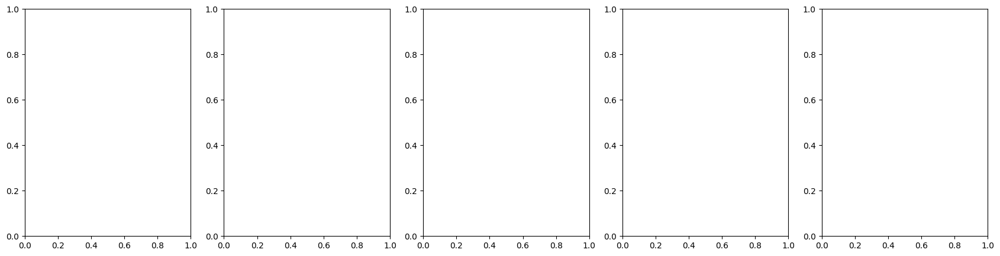

In [181]:
from utils import view_data
_ = view_data(img_denorm(data[0], v_mean, v_std), target[0], 5)
plt.savefig(f'Imgnet-orig-sample.png', bbox_inches='tight')

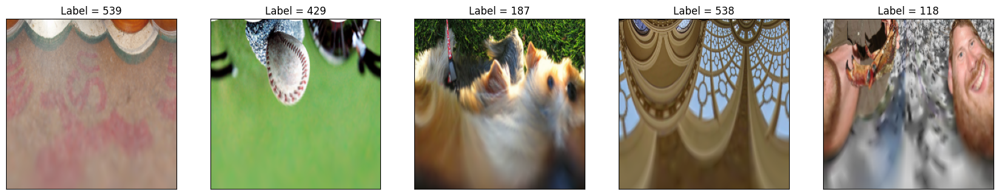

In [116]:
_ = view_data(img_denorm(logPolx[0], v_mean, v_std), target[0], 5)

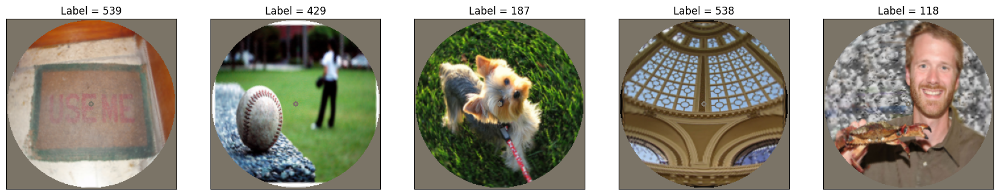

In [117]:
donut_data_rec = torch.zeros_like(logPolx[0])
what_grid_params = (-1,-6)
for i in range(len(logPolx[0])):
    img = logPolx[0][i].permute(1,2,0).detach().numpy()
    if  what_grid_params[0] < what_grid_params[1]:
        img = donut_LogPolar_Linear(img, what_grid_params[0], what_grid_params[1], r=120, output=(240,240,3))
    else:
        img = donut_LogPolar_Linear(np.flipud(img), what_grid_params[1], what_grid_params[0], r=120, output=(240,240,3))
    #img = logpolar_linear(img, -4, 0, r=60, output=(240,240,3), verb=(i==0))
    donut_data_rec[i] = torch.FloatTensor(img).permute(2,0,1)
reconstructed = view_data(img_denorm(donut_data_rec, v_mean, v_std), target[0], 5)

In [118]:
import json
fname = "imagenet-simple-labels.json"

with open(fname,'r') as f:
    class_labels = json.load(f)

/tmp/ipykernel_981660/322230875.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(3,3))


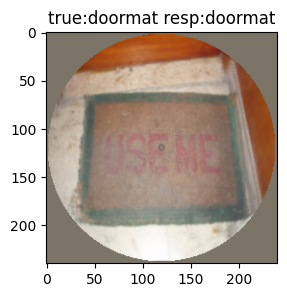

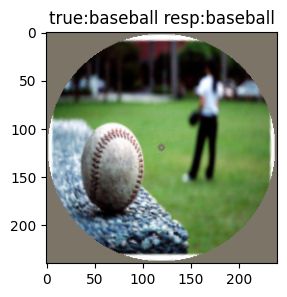

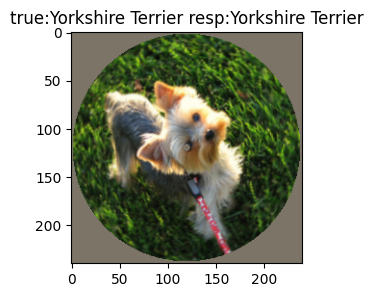

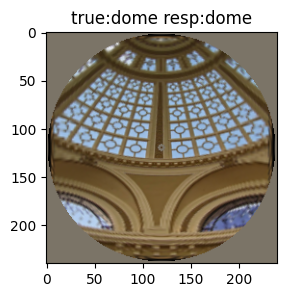

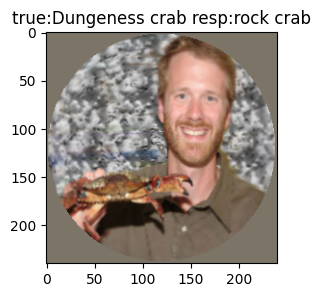

...

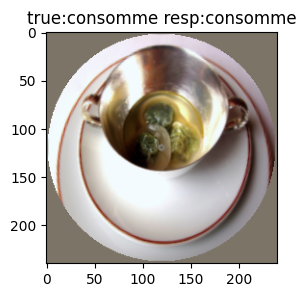

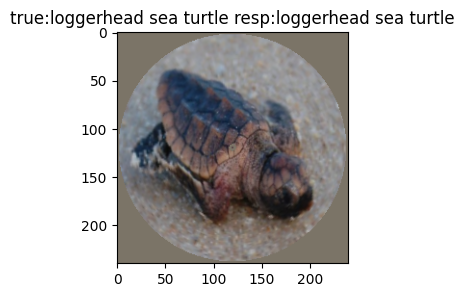

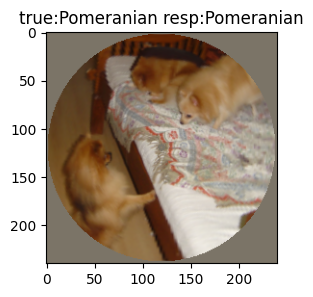

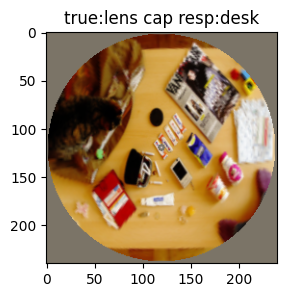

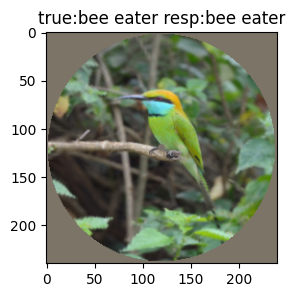

In [119]:
for i in range(n_samples):
    for num in range(args.batch_size):
        plt.figure(figsize=(3,3))
        img = logPolx[i][num].permute(1,2,0).detach().numpy()
        if  what_grid_params[0] < what_grid_params[1]:
            img = donut_LogPolar_Linear(img, what_grid_params[0], what_grid_params[1], r=120, output=(240,240,3))
        else:
            img = donut_LogPolar_Linear(np.flipud(img), what_grid_params[1], what_grid_params[0], r=120, output=(240,240,3))
        img = torch.FloatTensor(img).permute(2,0,1).unsqueeze(0)
        plt.imshow(img_denorm(img, v_mean, v_std).permute(1,2,0).detach().numpy())
        plt.title('true:'+class_labels[target[i][num]]+' resp:'+class_labels[cat[i][num]])
        #plt.title(' resp:'+class_labels[cat[i][num]])
       

In [120]:
ref_data, ref_target = data, target

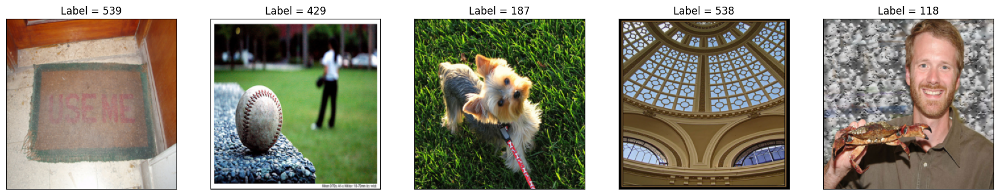

In [182]:
from utils import view_data
_ = view_data(img_denorm(ref_data[0], v_mean, v_std), ref_target[0], 5)
plt.savefig(f'Imgnet-orig-sample.png', bbox_inches='tight')

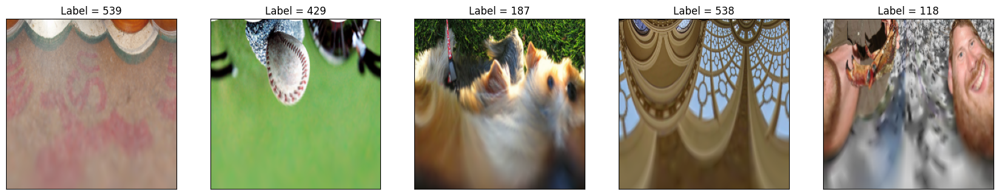

In [183]:
for i in range(n_samples):
    with torch.no_grad():
        logPolx = F.grid_sample(ref_data[0].to(device), model.what_grid)

_ = view_data(img_denorm(logPolx, v_mean, v_std), ref_target[0], 5)
plt.savefig(f'Imgnet-logpol-sample.png', bbox_inches='tight')

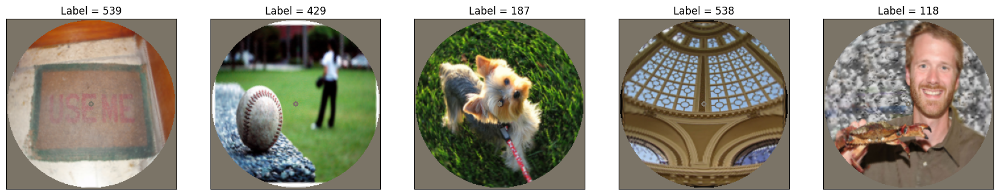

In [184]:
donut_data_rec = torch.zeros_like(logPolx)
what_grid_params = (-1,-6)
for i in range(len(logPolx)):
    img = logPolx[i].permute(1,2,0).detach().numpy()
    if  what_grid_params[0] < what_grid_params[1]:
        img = donut_LogPolar_Linear(img, what_grid_params[0], what_grid_params[1], r=120, output=(240,240,3))
    else:
        img = donut_LogPolar_Linear(np.flipud(img), what_grid_params[1], what_grid_params[0], r=120, output=(240,240,3))
    #img = logpolar_linear(img, -4, 0, r=60, output=(240,240,3), verb=(i==0))
    donut_data_rec[i] = torch.FloatTensor(img).permute(2,0,1)
reconstructed = view_data(img_denorm(donut_data_rec, v_mean, v_std), ref_target[0], 5)
plt.savefig(f'Imgnet-rec-sample.png', bbox_inches='tight')

In [123]:
ref_target

[tensor([539, 429, 187, 538, 118, 796, 941, 601,  22, 432, 996, 463, 124, 847,
         838, 735, 322, 636, 614, 821, 448, 213, 900,  60, 154, 903, 568, 203,
         522, 479, 438, 442, 948, 777, 140, 925,  33, 259, 622,  92])]

In [6]:
mem_acc_sum = {}
mem_acc_max = {}

#f_what =    "resnet_polar_1000"           
#what_params = torch.load(save_path+f_what+'.pt', map_location=torch.device('cpu'))
#model.resnet.load_state_dict(what_params, strict=False)
#model.what_grid = model.logPolarGrid(0,-5) 
model.eval()

for args.radius in (0.2,):   
    
    mem_acc_sum[args.radius] = np.zeros((100,20))
    mem_acc_max[args.radius] = np.zeros((100,20))
    
    
    for test in range(100):
    
        with torch.no_grad():
    
            data, target = next(iter(dataloader['test']))
            #data, target = data.to(device, dtype=torch.float), target.to(device)
        
            mem_output = []
            mem_x = []
            print('***', test, '***')
            for i in range(20):
                if i == 0:               
                    model.do_what = False               
                elif i == 1:               
                    model.do_what = True
                                           
                print(i, end=' ')
                output = model(data)
                y_out = output[0].detach().numpy()
                if model.do_what == False:
                    print('OK!')
                    sum_output = y_out.copy()
                    max_output = y_out.copy()
                else:
                    sum_output += y_out
                    max_output = np.max((max_output, y_out), axis=0)
                mem_output.append(y_out)
                #plt.plot(output[0][2,:])
                mem_x  += [output[3].detach().numpy()]
                sum_pred = sum_output.argmax(axis=1)
                max_pred = max_output.argmax(axis=1)
                label = target.detach().numpy()
                #print(label, pred)
                print('sum', np.equal(label, sum_pred).mean(), 'max', np.equal(label, max_pred).mean())
                mem_acc_sum[args.radius][test,i] = np.equal(label, sum_pred).mean()
                mem_acc_max[args.radius][test,i] = np.equal(label, max_pred).mean()
            print(mem_acc_sum[args.radius][test,:])
            print(mem_acc_max[args.radius][test,:])



*** 0 ***
0 OK!
sum 0.8 max 0.8
1 tensor([0.3092, 0.0161])


/home/manu/venv/lib/python3.9/site-packages/torch/nn/functional.py:4277: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(
/home/manu/venv/lib/python3.9/site-packages/torch/nn/functional.py:4215: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


sum 0.8 max 0.775
2 tensor([ 0.1170, -0.2457])
sum 0.775 max 0.75
3 tensor([-0.0932,  0.0178])
sum 0.775 max 0.75
4 tensor([-0.6074, -0.1740])
sum 0.775 max 0.75
5 tensor([-0.1261, -0.1834])
sum 0.75 max 0.8
6 tensor([0.3601, 0.1674])
sum 0.775 max 0.775
7 tensor([-0.0852, -0.0028])
sum 0.75 max 0.775
8 tensor([ 0.0039, -0.2151])
sum 0.725 max 0.775
9 tensor([0.1050, 0.3413])
sum 0.725 max 0.775
10 tensor([-0.0659,  0.2034])
sum 0.75 max 0.8
11 tensor([ 0.2694, -0.0960])
sum 0.725 max 0.8
12 tensor([ 0.1630, -0.1897])
sum 0.75 max 0.8
13 tensor([ 0.0340, -0.2675])
sum 0.775 max 0.8
14 tensor([0.3851, 0.0111])
sum 0.75 max 0.825
15 tensor([0.1231, 0.2035])
sum 0.75 max 0.825
16 tensor([-0.0040, -0.0182])
sum 0.75 max 0.825
17 tensor([-0.0865, -0.2534])
sum 0.75 max 0.825
18 tensor([ 0.0682, -0.1032])
sum 0.775 max 0.825
19 tensor([-0.4576,  0.4159])
sum 0.775 max 0.825
[0.8   0.8   0.775 0.775 0.775 0.75  0.775 0.75  0.725 0.725 0.75  0.725
 0.75  0.775 0.75  0.75  0.75  0.75  0.775 0.7

dict_keys([0.1])

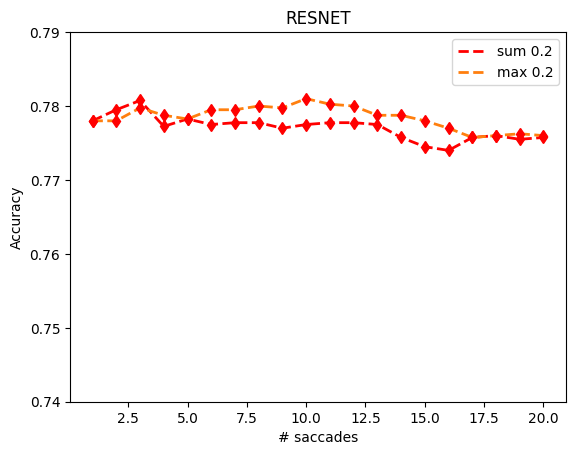

In [12]:
linestyle = {0.1:"solid", 0.2:"dashed", 0.3:"dotted"}
for args.radius in (0.2,):
    #for test in range(100):
    #    plt.plot(range(1,11), mem_acc_max[args.radius][test,:],'k', alpha=.1)
    plt.plot(range(1,21), 
             np.mean(mem_acc_sum[args.radius], axis=0),
             'r', 
             linewidth=2, 
             linestyle=linestyle[args.radius], 
             label='sum ' + str(args.radius))
    plt.plot(range(1,21), np.mean(mem_acc_sum[args.radius], axis=0),'rd', linewidth=2)
    plt.plot(range(1,21), 
             np.mean(mem_acc_max[args.radius], axis=0),
             'tab:orange',
             linewidth=2, 
             linestyle=linestyle[args.radius],
             label='max ' + str(args.radius))
    plt.plot(range(1,21), np.mean(mem_acc_max[args.radius], axis=0),'rd', linewidth=2)
    plt.xlabel("# saccades")
    #plt.ylim((0.15,0.35))
    #plt.yticks([.16,.18,.20,.22,.24,.26,.28,.30,.32,.34])
    plt.ylabel('Accuracy')
    plt.title(f'RESNET')
plt.legend()
plt.ylim([0.74, 0.79])
plt.savefig(f'RESNET_saccades.png', bbox_inches='tight')

In [13]:
with open('mem_acc_res_sum.pkl', 'wb') as f:
    pickle.dump(mem_acc_sum, f)

with open('mem_acc_res_max.pkl', 'wb') as f:
    pickle.dump(mem_acc_max, f)
    
#with open('mem_res_log_scores.pkl', 'wb') as f:
#    pickle.dump(mem_log_scores, f)


NameError: name 'mem_log_scores' is not defined

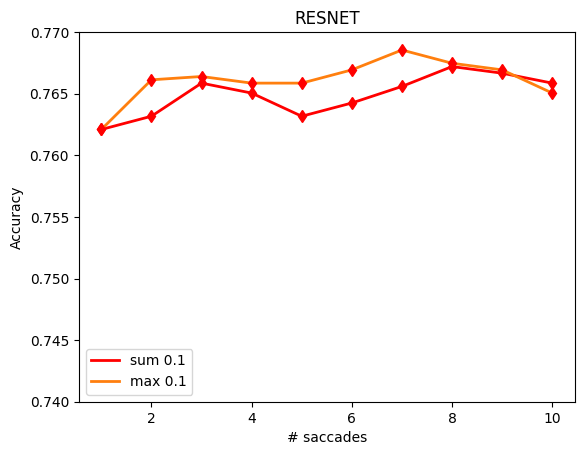

In [ ]:
linestyle = {0.1:"solid", 0.2:"dashed", 0.3:"dotted"}
for args.radius in (0.1,):
    #for test in range(100):
    #    plt.plot(range(1,11), mem_acc_max[args.radius][test,:],'k', alpha=.1)
    plt.plot(range(1,11), 
             np.mean(mem_acc_sum[args.radius][:93,:], axis=0),
             'r', 
             linewidth=2, 
             linestyle=linestyle[args.radius], 
             label='sum ' + str(args.radius))
    plt.plot(range(1,11), np.mean(mem_acc_sum[args.radius][:93,:], axis=0),'rd', linewidth=2)
    plt.plot(range(1,11), 
             np.mean(mem_acc_max[args.radius][:93,:], axis=0),
             'tab:orange',
             linewidth=2, 
             linestyle=linestyle[args.radius],
             label='max ' + str(args.radius))
    plt.plot(range(1,11), np.mean(mem_acc_max[args.radius][:93,:], axis=0),'rd', linewidth=2)
    plt.xlabel("# saccades")
    #plt.ylim((0.15,0.35))
    #plt.yticks([.16,.18,.20,.22,.24,.26,.28,.30,.32,.34])
    plt.ylabel('Accuracy')
    plt.title(f'RESNET')
plt.legend()
plt.ylim([0.74, 0.77])
plt.savefig(f'RESNET_saccades.png', bbox_inches='tight')

In [16]:
mem_acc_sum_focus = {}
mem_acc_max_focus = {}

f_what =  "resnet_focus"           
what_params = torch.load(save_path+f_what+'.pt', map_location=torch.device('cpu'))
model.resnet.load_state_dict(what_params, strict=False)
model.what_grid = model.logPolarGrid(0,-5) 
model.eval()

for args.radius in (0.1, 0.2, 0.3):

    mem_acc_sum_focus[args.radius] = np.zeros((100,10))
    mem_acc_max_focus[args.radius] = np.zeros((100,10))
    
    
    for test in range(100):
    
        with torch.no_grad():
    
            data, target = next(iter(dataloader['test']))
            #data, target = data.to(device, dtype=torch.float), target.to(device)
        
            mem_output = []
            mem_x = []
            print('***', test, '***')
            for i in range(10):
                if i == 0:               
                    model.do_what = False               
                elif i == 1:               
                    model.do_what = True
                                           
                print(i, end=' ')
                output = model(data)
                y_out = output[0].detach().numpy()
                if model.do_what == False:
                    print('OK!')
                    sum_output = y_out.copy()
                    max_output = y_out.copy()
                else:
                    sum_output += y_out
                    max_output = np.max((max_output, y_out), axis=0)
                mem_output.append(y_out)
                #plt.plot(output[0][2,:])
                mem_x  += [output[3].detach().numpy()]
                sum_pred = sum_output.argmax(axis=1)
                max_pred = max_output.argmax(axis=1)
                label = target.detach().numpy()
                #print(label, pred)
                print('sum', np.equal(label, sum_pred).mean(), 'max', np.equal(label, max_pred).mean())
                mem_acc_sum_focus[args.radius][test,i] = np.equal(label, sum_pred).mean()
                mem_acc_max_focus[args.radius][test,i] = np.equal(label, max_pred).mean()
            print(mem_acc_sum_focus[args.radius][test,:])
            print(mem_acc_max_focus[args.radius][test,:])



*** 0 ***
0 OK!
sum 0.775 max 0.775
1 tensor([0.1627, 0.0361])
sum 0.75 max 0.775
2 tensor([-0.0505,  0.2012])
sum 0.8 max 0.8
3 tensor([-0.0661,  0.0766])
sum 0.775 max 0.825
4 tensor([0.2030, 0.0448])
sum 0.775 max 0.825
5 tensor([0.1971, 0.1168])
sum 0.775 max 0.85
6 tensor([0.0805, 0.0281])
sum 0.775 max 0.825
7 tensor([0.0884, 0.0358])
sum 0.775 max 0.825
8 tensor([ 0.1688, -0.0395])
sum 0.775 max 0.825
9 tensor([-0.0338, -0.0227])
sum 0.775 max 0.825
[0.775 0.75  0.8   0.775 0.775 0.775 0.775 0.775 0.775 0.775]
[0.775 0.775 0.8   0.825 0.825 0.85  0.825 0.825 0.825 0.825]
*** 1 ***
0 OK!
sum 0.575 max 0.575
1 tensor([0.0179, 0.0360])
sum 0.525 max 0.525
2 tensor([ 0.0234, -0.0348])
sum 0.575 max 0.55
3 tensor([ 0.2152, -0.1712])
sum 0.575 max 0.575
4 tensor([0.0662, 0.1432])
sum 0.6 max 0.575
5 tensor([ 0.0448, -0.1627])
sum 0.6 max 0.6
6 tensor([0.0148, 0.0515])
sum 0.6 max 0.6
7 tensor([-0.0613,  0.0765])
sum 0.6 max 0.6
8 tensor([-0.0328, -0.0695])
sum 0.575 max 0.575
9 tensor

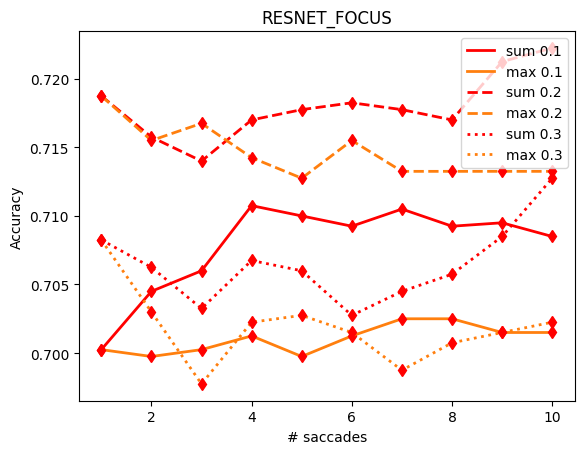

In [17]:
linestyle = {0.1:"solid", 0.2:"dashed", 0.3:"dotted"}
for args.radius in (0.1, 0.2, 0.3):
    #for test in range(100):
    #    plt.plot(range(1,11), mem_acc_max[args.radius][test,:],'k', alpha=.1)
    plt.plot(range(1,11), 
             np.mean(mem_acc_sum_focus[args.radius], axis=0),
             'r', 
             linewidth=2, 
             linestyle=linestyle[args.radius], 
             label='sum ' + str(args.radius))
    plt.plot(range(1,11), np.mean(mem_acc_sum_focus[args.radius], axis=0),'rd', linewidth=2)
    plt.plot(range(1,11), 
             np.mean(mem_acc_max_focus[args.radius], axis=0),
             'tab:orange',
             linewidth=2, 
             linestyle=linestyle[args.radius],
             label='max ' + str(args.radius))
    plt.plot(range(1,11), np.mean(mem_acc_max_focus[args.radius], axis=0),'rd', linewidth=2)
    plt.xlabel("# saccades")
    #plt.ylim((0.15,0.35))
    #plt.yticks([.16,.18,.20,.22,.24,.26,.28,.30,.32,.34])
    plt.ylabel('Accuracy')
    plt.title(f'RESNET_FOCUS')
plt.legend()
plt.savefig(f'RESNET_FOCUS_saccades.png', bbox_inches='tight')

# WHAT LOGPOL -0.5 / -5.5 

In [4]:
model = Grid_AttentionTransNet(do_stn=False, do_what = True, LAMBDA=LAMBDA, deterministic=deterministic).to(device)
save_path = 'out/'


/home/INT/dauce.e/venv/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/INT/dauce.e/venv/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [28]:
mem_acc_sum = {}
mem_acc_max = {}


args.radius = 0.2

n_sac = 20
n_sample = 100

for f_what in ("resnet_focus", "resnet_polar_1000"):

    what_params = torch.load(save_path+f_what+'.pt', map_location=torch.device('cpu'))
    model.resnet.load_state_dict(what_params, strict=False)

    model.what_grid = model.logPolarGrid(-0.5,-5.5) 
    model.eval()   

    mem_acc_sum[f_what] = np.zeros((n_sample,n_sac))
    mem_acc_max[f_what] = np.zeros((n_sample,n_sac))
    
    
    for test in range(n_sample):
    
        with torch.no_grad():
    
            data, target = next(iter(dataloader['test']))
            #data, target = data.to(device, dtype=torch.float), target.to(device)
        
            mem_output = []
            mem_x = []
            print('***', test, '***')
            for i in range(n_sac):
                if i == 0:               
                    model.do_what = False               
                elif i == 1:               
                    model.do_what = True
                                           
                print(i, end=' ')
                output = model(data)
                y_out = output[0].detach().numpy()
                if model.do_what == False:
                    print('OK!')
                    sum_output = y_out.copy()
                    max_output = y_out.copy()
                else:
                    sum_output += y_out
                    max_output = np.max((max_output, y_out), axis=0)
                mem_output.append(y_out)
                #plt.plot(output[0][2,:])
                mem_x  += [output[3].detach().numpy()]
                sum_pred = sum_output.argmax(axis=1)
                max_pred = max_output.argmax(axis=1)
                label = target.detach().numpy()
                #print(label, pred)
                print('sum', np.equal(label, sum_pred).mean(), 'max', np.equal(label, max_pred).mean())
                mem_acc_sum[f_what][test,i] = np.equal(label, sum_pred).mean()
                mem_acc_max[f_what][test,i] = np.equal(label, max_pred).mean()
            print(mem_acc_sum[f_what][test,:])
            print(mem_acc_max[f_what][test,:])


*** 0 ***
0 OK!
sum 0.625 max 0.625
1 tensor([0.1976, 0.1061])
sum 0.65 max 0.65
2 tensor([0.0464, 0.2610])
sum 0.7 max 0.675
3 tensor([-0.1275, -0.3396])
sum 0.75 max 0.675
4 tensor([ 0.0824, -0.2998])
sum 0.675 max 0.65
5 tensor([ 0.0260, -0.2193])
sum 0.75 max 0.65
6 tensor([0.0327, 0.1505])
sum 0.7 max 0.675
7 tensor([0.0901, 0.1068])
sum 0.7 max 0.65
8 tensor([0.1945, 0.0515])
sum 0.675 max 0.65
9 tensor([ 0.0684, -0.2128])
sum 0.7 max 0.65
10 tensor([-0.2304,  0.1508])
sum 0.7 max 0.65
11 tensor([0.5501, 0.1748])
sum 0.7 max 0.65
12 tensor([ 0.2959, -0.1681])
sum 0.7 max 0.65
13 tensor([0.2308, 0.5666])
sum 0.7 max 0.65
14 tensor([-0.3069, -0.2350])
sum 0.7 max 0.65
15 tensor([0.1053, 0.0309])
sum 0.7 max 0.65
16 tensor([-0.1095, -0.3010])
sum 0.675 max 0.65
17 tensor([-0.4371,  0.1798])
sum 0.675 max 0.65
18 tensor([-0.0907, -0.1646])
sum 0.675 max 0.65
19 tensor([-0.0569,  0.0095])
sum 0.675 max 0.65
[0.625 0.65  0.7   0.75  0.675 0.75  0.7   0.7   0.675 0.7   0.7   0.7
 0.7   

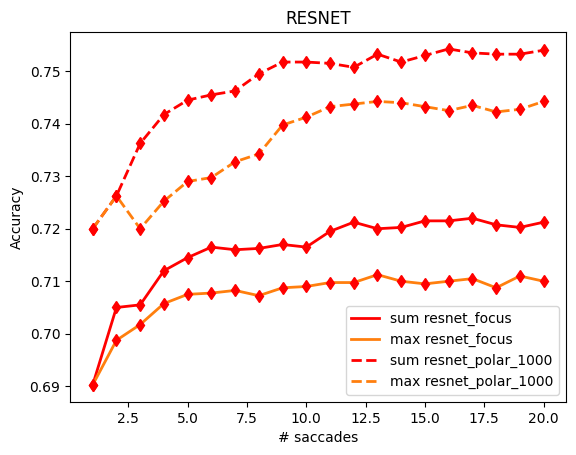

In [30]:
linestyle = {"resnet_focus":"solid", "resnet_polar_1000":"dashed"}
for f_what in ("resnet_focus", "resnet_polar_1000"):
    #for test in range(100):
    #    plt.plot(range(1,11), mem_acc_max[args.radius][test,:],'k', alpha=.1)
    plt.plot(range(1,21), 
             np.mean(mem_acc_sum[f_what], axis=0),
             'r', 
             linewidth=2, 
             linestyle=linestyle[f_what], 
             label='sum ' + str(f_what))
    plt.plot(range(1,21), np.mean(mem_acc_sum[f_what], axis=0),'rd', linewidth=2)
    plt.plot(range(1,21), 
             np.mean(mem_acc_max[f_what], axis=0),
             'tab:orange',
             linewidth=2, 
             linestyle=linestyle[f_what],
             label='max ' + str(f_what))
    plt.plot(range(1,21), np.mean(mem_acc_max[f_what], axis=0),'rd', linewidth=2)
    plt.xlabel("# saccades")
    #plt.ylim((0.15,0.35))
    #plt.yticks([.16,.18,.20,.22,.24,.26,.28,.30,.32,.34])
    plt.ylabel('Accuracy')
    plt.title(f'RESNET')
plt.legend()
plt.savefig(f'RESNET_saccades.png', bbox_inches='tight')

In [31]:
mem_mem_acc_sum = np.copy(mem_acc_sum)
mem_mem_acc_max = np.copy(mem_acc_max)

# WHAT LOGPOL -1 / -6 

In [5]:
mem_acc_sum = {}
mem_acc_max = {}


args.radius = 0.2

n_sac = 20
n_sample = 100

for f_what in ("resnet_focus", "resnet_polar_1000"):

    what_params = torch.load(save_path+f_what+'.pt', map_location=torch.device('cpu'))
    model.resnet.load_state_dict(what_params, strict=False)

    model.what_grid = model.logPolarGrid(-1,-6) 
    model.eval()   

    mem_acc_sum[f_what] = np.zeros((n_sample,n_sac))
    mem_acc_max[f_what] = np.zeros((n_sample,n_sac))
    
    
    for test in range(n_sample):
    
        with torch.no_grad():
    
            data, target = next(iter(dataloader['test']))
            #data, target = data.to(device, dtype=torch.float), target.to(device)
        
            mem_output = []
            mem_x = []
            print('***', test, '***')
            for i in range(n_sac):
                if i == 0:               
                    model.do_what = False               
                elif i == 1:               
                    model.do_what = True
                                           
                print(i, end=' ')
                output = model(data)
                y_out = output[0].detach().numpy()
                if model.do_what == False:
                    print('OK!')
                    sum_output = y_out.copy()
                    max_output = y_out.copy()
                else:
                    sum_output += y_out
                    max_output = np.max((max_output, y_out), axis=0)
                mem_output.append(y_out)
                #plt.plot(output[0][2,:])
                mem_x  += [output[3].detach().numpy()]
                sum_pred = sum_output.argmax(axis=1)
                max_pred = max_output.argmax(axis=1)
                label = target.detach().numpy()
                #print(label, pred)
                print('sum', np.equal(label, sum_pred).mean(), 'max', np.equal(label, max_pred).mean())
                mem_acc_sum[f_what][test,i] = np.equal(label, sum_pred).mean()
                mem_acc_max[f_what][test,i] = np.equal(label, max_pred).mean()
            print(mem_acc_sum[f_what][test,:])
            print(mem_acc_max[f_what][test,:])


*** 0 ***
0 

/home/INT/dauce.e/venv/lib/python3.11/site-packages/torch/nn/functional.py:4296: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


OK!
sum 0.65 max 0.65
1 tensor([ 0.0898, -0.0028])


/home/INT/dauce.e/venv/lib/python3.11/site-packages/torch/nn/functional.py:4358: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn(


sum 0.675 max 0.625
2 tensor([ 0.3693, -0.2559])
sum 0.7 max 0.625
3 tensor([-0.0105, -0.0146])
sum 0.675 max 0.625
4 tensor([-0.0301,  0.1993])
sum 0.675 max 0.625
5 tensor([-0.0369,  0.1488])
sum 0.675 max 0.625
6 tensor([-0.0104, -0.2627])
sum 0.675 max 0.65
7 tensor([-0.2875, -0.0620])
sum 0.675 max 0.625
8 tensor([ 0.0052, -0.2182])
sum 0.675 max 0.625
9 tensor([-0.1517, -0.0844])
sum 0.675 max 0.625
10 tensor([-0.1004, -0.2486])
sum 0.675 max 0.625
11 tensor([0.1212, 0.0903])
sum 0.675 max 0.625
12 tensor([-0.1048,  0.1079])
sum 0.675 max 0.625
13 tensor([ 0.1876, -0.4750])
sum 0.675 max 0.65
14 tensor([-0.2013, -0.0242])
sum 0.675 max 0.65
15 tensor([-0.0292,  0.1762])
sum 0.65 max 0.65
16 tensor([0.2383, 0.2325])
sum 0.65 max 0.65
17 tensor([-0.1324, -0.1172])
sum 0.65 max 0.65
18 tensor([-0.0468, -0.1187])
sum 0.65 max 0.625
19 tensor([-0.2178, -0.0546])
sum 0.65 max 0.625
[0.65  0.675 0.7   0.675 0.675 0.675 0.675 0.675 0.675 0.675 0.675 0.675
 0.675 0.675 0.675 0.65  0.65  0

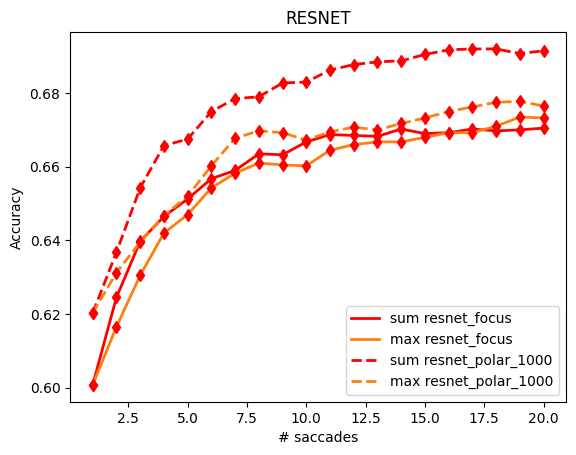

In [6]:
linestyle = {"resnet_focus":"solid", "resnet_polar_1000":"dashed"}
for f_what in ("resnet_focus", "resnet_polar_1000"):
    #for test in range(100):
    #    plt.plot(range(1,11), mem_acc_max[args.radius][test,:],'k', alpha=.1)
    plt.plot(range(1,21), 
             np.mean(mem_acc_sum[f_what], axis=0),
             'r', 
             linewidth=2, 
             linestyle=linestyle[f_what], 
             label='sum ' + str(f_what))
    plt.plot(range(1,21), np.mean(mem_acc_sum[f_what], axis=0),'rd', linewidth=2)
    plt.plot(range(1,21), 
             np.mean(mem_acc_max[f_what], axis=0),
             'tab:orange',
             linewidth=2, 
             linestyle=linestyle[f_what],
             label='max ' + str(f_what))
    plt.plot(range(1,21), np.mean(mem_acc_max[f_what], axis=0),'rd', linewidth=2)
    plt.xlabel("# saccades")
    #plt.ylim((0.15,0.35))
    #plt.yticks([.16,.18,.20,.22,.24,.26,.28,.30,.32,.34])
    plt.ylabel('Accuracy')
    plt.title(f'RESNET')
plt.legend()
plt.savefig(f'RESNET_saccades_1.png', bbox_inches='tight')